## install the required packages.

In [12]:
# Install required packages
!pip install ultralytics
!pip install -U datasets
!pip install torch torchvision
!pip install matplotlib pandas numpy pillow

## Data Preparation

Loading dataset...
DatasetDict({
    train: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects', 'paligemma_labels'],
        num_rows: 307
    })
    validation: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects', 'paligemma_labels'],
        num_rows: 57
    })
    test: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects', 'paligemma_labels'],
        num_rows: 34
    })
})
Dataset features: {'image_id': Value(dtype='int64', id=None), 'image': Image(mode=None, decode=True, id=None), 'width': Value(dtype='int32', id=None), 'height': Value(dtype='int32', id=None), 'objects': Sequence(feature={'id': Value(dtype='int64', id=None), 'area': Value(dtype='int64', id=None), 'bbox': Sequence(feature=Value(dtype='float32', id=None), length=4, id=None), 'category': ClassLabel(names=['barricade', 'dumpster', 'excavators', 'gloves', 'hardhat', 'mask', 'no-hardhat', 'no-mask', 'no-safety vest', 'person', 'safety net',

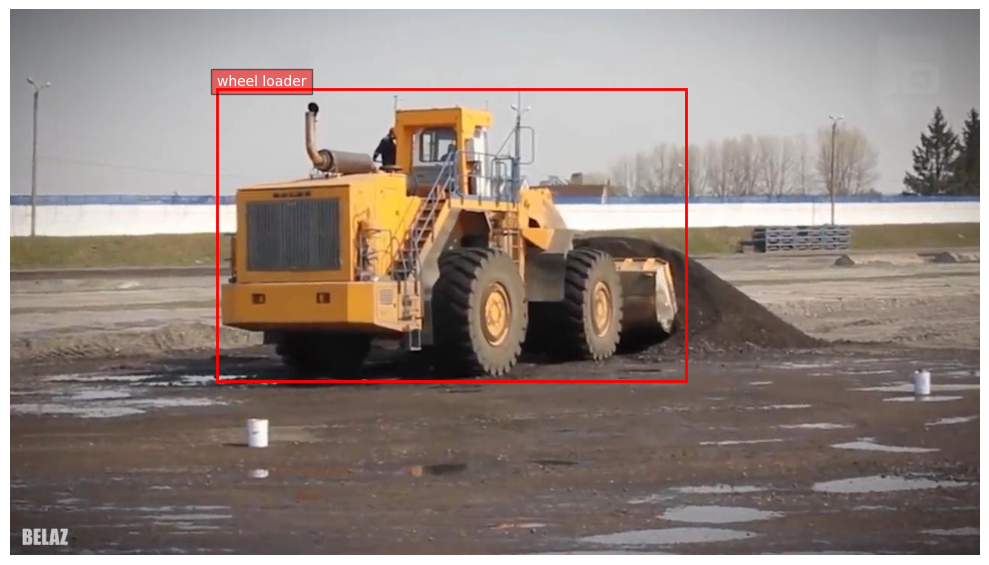



Sample 272:


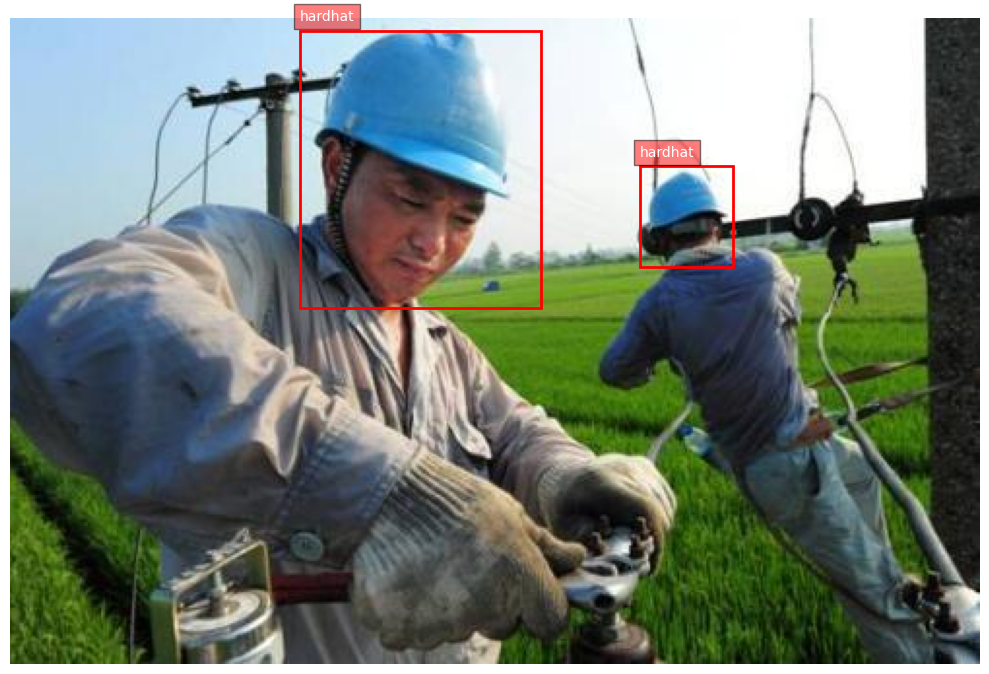



Sample 75:


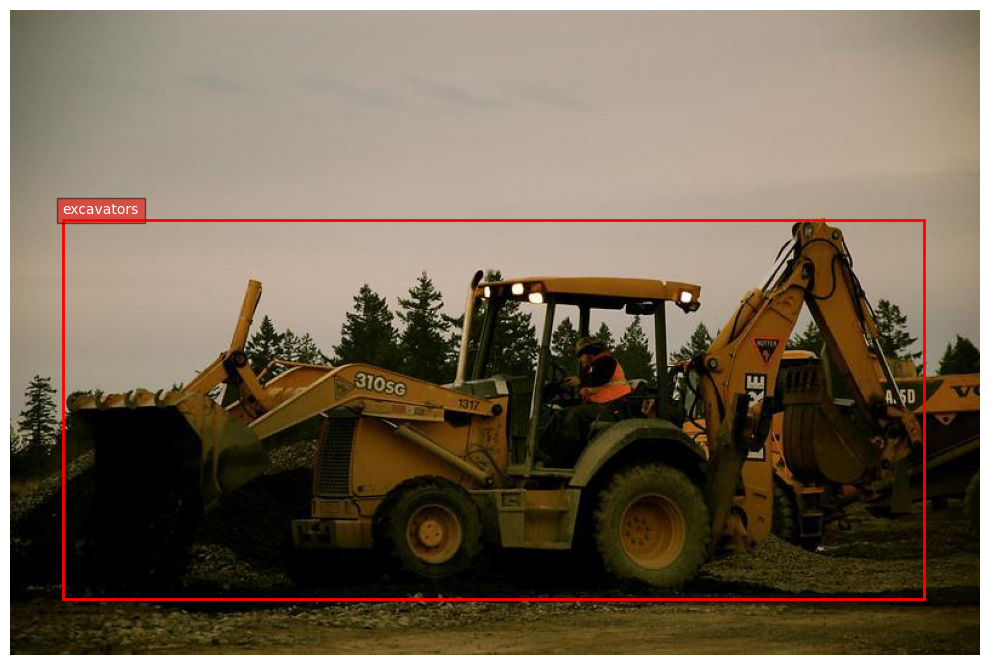

In [13]:
import os
import time
import random
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from datasets import load_dataset
from ultralytics import YOLO
import pandas as pd
from huggingface_hub import notebook_login
from huggingface_hub import HfFolder

# Replace with your actual Hugging Face token (READ access is enough)

HfFolder.save_token("token")
print("Loading dataset...")
dataset = load_dataset("pyimagesearch/construction-safety-object-detection-paligemma")
print(dataset)

# Explore dataset structure
print("Dataset features:", dataset["train"].features)
print("Number of training samples:", len(dataset["train"]))
print("Number of validation samples:", len(dataset["validation"]))

# Extract class labels
categories = dataset["train"].features["objects"].feature["category"].names
print("Categories:", categories)
# Visualize sample images with bounding boxes
def visualize_sample(sample, figsize=(10, 10)):
    """
    Visualize an image with its bounding boxes

    Parameters:
    - sample: A dictionary containing 'image' and 'objects' keys
    - figsize: Figure size for the plot
    """
    image = sample["image"]
    objects = sample["objects"]

    plt.figure(figsize=figsize)
    plt.imshow(image)

    for bbox, category_id in zip(objects["bbox"], objects["category"]):
        # COCO format: [x_min, y_min, width, height]
        x_min, y_min, width, height = bbox
        category = categories[category_id]

        # Create rectangle
        rect = plt.Rectangle((x_min, y_min), width, height,
                             linewidth=2, edgecolor='r', facecolor='none')
        plt.gca().add_patch(rect)

        # Add label
        plt.text(x_min, y_min - 5, category,
                 bbox=dict(facecolor='red', alpha=0.5), fontsize=10, color='white')

    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Visualize a few examples
print("Visualizing samples...")
for i in range(3):
    sample_idx = random.randint(0, len(dataset["train"]) - 1)
    sample = dataset["train"][sample_idx]
    print(f"Sample {sample_idx}:")
    visualize_sample(sample)
    print("\n")


## Convert Data to YOLO Format

In [14]:
def prepare_yolo_dataset(dataset_split, output_dir, split_name):
    """
    Convert dataset to YOLO format

    Parameters:
    - dataset_split: Dataset split (train/validation)
    - output_dir: Directory to save YOLO formatted data
    - split_name: Name of the split (train/valid)

    Returns:
    - Paths to images and labels directories
    """
    # Create directories
    images_dir = os.path.join(output_dir, split_name, 'images')
    labels_dir = os.path.join(output_dir, split_name, 'labels')
    os.makedirs(images_dir, exist_ok=True)
    os.makedirs(labels_dir, exist_ok=True)

    for idx, sample in enumerate(dataset_split):
        # Save image
        image = sample["image"]
        image_path = os.path.join(images_dir, f"{idx:05d}.jpg")
        image.save(image_path)

        # Process annotations
        objects = sample["objects"]
        image_width, image_height = image.size

        # Create YOLO format label file
        label_path = os.path.join(labels_dir, f"{idx:05d}.txt")
        with open(label_path, 'w') as f:
            for bbox, category_id in zip(objects["bbox"], objects["category"]):
                # Convert COCO format [x_min, y_min, width, height] to YOLO format
                x_min, y_min, width, height = bbox

                # Normalize coordinates (YOLO format is normalized)
                x_center = (x_min + width / 2) / image_width
                y_center = (y_min + height / 2) / image_height
                norm_width = width / image_width
                norm_height = height / image_height

                # Write to file: class x_center y_center width height
                f.write(f"{category_id} {x_center} {y_center} {norm_width} {norm_height}\n")

    return images_dir, labels_dir

# Prepare the dataset for YOLO
print("Preparing data for YOLO...")
yolo_data_dir = "construction_safety_yolo"
train_images_dir, train_labels_dir = prepare_yolo_dataset(dataset["train"], yolo_data_dir, "train")
val_images_dir, val_labels_dir = prepare_yolo_dataset(dataset["validation"], yolo_data_dir, "valid")

# Create YAML configuration file for YOLOv8
yaml_path = os.path.join(yolo_data_dir, "dataset.yaml")
with open(yaml_path, 'w') as f:
    f.write(f"path: {os.path.abspath(yolo_data_dir)}\n")
    f.write(f"train: {os.path.join('train', 'images')}\n")
    f.write(f"val: {os.path.join('valid', 'images')}\n")
    f.write("names:\n")
    for i, name in enumerate(categories):
        f.write(f"  {i}: {name}\n")

print(f"Created YOLO configuration file at: {yaml_path}")



Preparing data for YOLO...
Created YOLO configuration file at: construction_safety_yolo/dataset.yaml


## Model Implementation (CILO 2.1)

In [15]:
def initialize_yolo_model(model_size='n'):
    """
    Initialize a pre-trained YOLOv8 model

    Parameters:
    - model_size: Size of the YOLO model ('n' for nano, 's' for small, etc.)

    Returns:
    - Initialized YOLO model
    """
    # TODO: Initialize a pre-trained YOLOv8 model
    # Choose an appropriate model size based on available resources
    # Hint: Use YOLO function from ultralytics library

    # TODO: Print model information (optional)

    return None  # Replace with actual model

# Initialize the YOLO model
print("Initializing YOLO model...")
yolo_model = initialize_yolo_model()  # Uncomment after implementing the function

# Alternative: Direct implementation if TODO is not completed
if yolo_model is None:
    yolo_model = YOLO('yolov8n.pt')  # Use nano model for faster training
    print(f"YOLO model initialized: {yolo_model}")


def initialize_yolo_model(model_size='n'):
    """
    Initialize a pre-trained YOLOv8 model

    Parameters:
    - model_size: Size of the YOLO model ('n' for nano, 's' for small, etc.)

    Returns:
    - Initialized YOLO model
    """
    from ultralytics import YOLO  # Import inside the function if needed

    # Initialize a pre-trained YOLOv8 model
    model_path = f'yolov8{model_size}.pt'  # Construct model filename, e.g., 'yolov8n.pt'
    model = YOLO(model_path)  # Load the model

    # Optional: Print model information
    print(f"Initialized YOLOv8-{model_size} model from {model_path}")
    print(model)

    return model

# Initialize the YOLO model
print("Initializing YOLO model...")
yolo_model = initialize_yolo_model()

# Alternative fallback (this part would not trigger now)
if yolo_model is None:
    yolo_model = YOLO('yolov8n.pt')  # Use nano model for faster training
    print(f"YOLO model initialized: {yolo_model}")


Initializing YOLO model...
YOLO model initialized: YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps

## Transfer Learning (CILO 2.2)

In [16]:
def train_yolo_model(model, data_yaml, epochs=10, imgsz=640, batch_size=8, experiment_name='construction_safety'):
    """
    Train the YOLO model using transfer learning

    Parameters:
    - model: Initialized YOLO model
    - data_yaml: Path to the YAML configuration file
    - epochs: Number of training epochs
    - imgsz: Input image size
    - batch_size: Batch size for training
    - experiment_name: Name for the training experiment

    Returns:
    - Training results
    """
    # TODO: Train the model using transfer learning
    # Set appropriate hyperparameters
    # Hint: Use the train method from the YOLO model

    # TODO: Print training summary

    return None  # Replace with actual results

# Train the model
print("Training YOLO model (this may take some time)...")
results = train_yolo_model(yolo_model, yaml_path)  # Uncomment after implementing the function

# Alternative: Direct implementation if TODO is not completed
if results is None:
    results = yolo_model.train(
        data=yaml_path,
        epochs=3,
        imgsz=640,
        batch=8,
        name='construction_safety'
    )
    print("Training completed!")


def train_yolo_model(model, data_yaml, epochs=10, imgsz=640, batch_size=8, experiment_name='construction_safety'):
    """
    Train the YOLO model using transfer learning

    Parameters:
    - model: Initialized YOLO model
    - data_yaml: Path to the YAML configuration file
    - epochs: Number of training epochs
    - imgsz: Input image size
    - batch_size: Batch size for training
    - experiment_name: Name for the training experiment

    Returns:
    - Training results
    """
    # Train the model using the train() method from Ultralytics YOLO
    results = model.train(
        data=data_yaml,       # Path to dataset YAML file
        epochs=epochs,        # Number of training epochs
        imgsz=imgsz,          # Image input size (resize to 640x640)
        batch=batch_size,     # Batch size
        name=experiment_name  # Experiment folder name to save results
    )

    # Print training summary
    print(f"Training finished for experiment: {experiment_name}")
    print(f"Results are saved in: runs/detect/{experiment_name}")

    return results

# Train the model
print("Training YOLO model (this may take some time)...")
results = train_yolo_model(yolo_model, yaml_path)

# Alternative: Direct implementation if needed
if results is None:
    results = yolo_model.train(
        data=yaml_path,
        epochs=3,
        imgsz=640,
        batch=8,
        name='construction_safety'
    )
    print("Training completed!")

Training YOLO model (this may take some time)...
Ultralytics 8.3.153 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=construction_safety_yolo/dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=3, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=construction_safety3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask

train: Scanning /content/construction_safety_yolo/train/labels.cache... 307 images, 4 backgrounds, 0 corrupt: 100%|██████████| 307/307 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 377.6±126.0 MB/s, size: 57.9 KB)


val: Scanning /content/construction_safety_yolo/valid/labels.cache... 57 images, 1 backgrounds, 0 corrupt: 100%|██████████| 57/57 [00:00<?, ?it/s]


Plotting labels to runs/detect/construction_safety3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000476, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/construction_safety3
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/3      1.15G      1.353      4.189      1.474         19        640: 100%|██████████| 39/39 [00:10<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.92it/s]

                   all         57        221     0.0279      0.186     0.0833     0.0728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/3      1.39G      1.391       3.36      1.509         17        640: 100%|██████████| 39/39 [00:05<00:00,  6.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.77it/s]

                   all         57        221      0.808      0.149      0.139     0.0737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/3      1.39G      1.393       2.88      1.447          9        640: 100%|██████████| 39/39 [00:06<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.76it/s]

                   all         57        221      0.691      0.228      0.209       0.13



3 epochs completed in 0.007 hours.
Optimizer stripped from runs/detect/construction_safety3/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/construction_safety3/weights/best.pt, 6.2MB

Validating runs/detect/construction_safety3/weights/best.pt...
Ultralytics 8.3.153 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,008,963 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.15it/s]


                   all         57        221       0.69      0.228      0.208       0.13
            excavators          3          3      0.135          1      0.497      0.291
                gloves          3          5          1          0          0          0
               hardhat         34        115      0.752      0.475      0.636      0.288
            no-hardhat          6          9          0          0     0.0394      0.027
               no-mask          7         14          1          0          0          0
        no-safety vest          6         14          1          0          0          0
                person          7         23          1          0     0.0299     0.0163
          safety shoes          3         13          1          0          0          0
           safety vest          2          6          1          0          0          0
            dump truck          7          8       0.12      0.125      0.185      0.158
          wheel loade

train: Scanning /content/construction_safety_yolo/train/labels.cache... 307 images, 4 backgrounds, 0 corrupt: 100%|██████████| 307/307 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 352.1±181.4 MB/s, size: 57.9 KB)


val: Scanning /content/construction_safety_yolo/valid/labels.cache... 57 images, 1 backgrounds, 0 corrupt: 100%|██████████| 57/57 [00:00<?, ?it/s]


Plotting labels to runs/detect/construction_safety4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000476, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/construction_safety4
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      1.24G       1.33      2.995      1.457          8        640: 100%|██████████| 39/39 [00:06<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.68it/s]

                   all         57        221      0.718      0.229      0.193      0.137



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      1.46G      1.283      2.892      1.426         16        640: 100%|██████████| 39/39 [00:06<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.69it/s]

                   all         57        221      0.774      0.259      0.241      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      1.46G      1.324       2.73      1.415          3        640: 100%|██████████| 39/39 [00:05<00:00,  7.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.62it/s]

                   all         57        221      0.651      0.311      0.242      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      1.46G      1.255      2.631      1.345         20        640: 100%|██████████| 39/39 [00:06<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.33it/s]

                   all         57        221       0.89      0.214      0.285      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      1.48G      1.216      2.594      1.339          5        640: 100%|██████████| 39/39 [00:05<00:00,  7.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.64it/s]

                   all         57        221      0.699      0.314      0.291      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      1.48G       1.21      2.445       1.34          3        640: 100%|██████████| 39/39 [00:06<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.70it/s]

                   all         57        221      0.732      0.309      0.318      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      1.48G      1.198      2.406      1.316          6        640: 100%|██████████| 39/39 [00:05<00:00,  7.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.21it/s]

                   all         57        221      0.734      0.291      0.321      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      1.48G      1.167      2.205      1.275          4        640: 100%|██████████| 39/39 [00:07<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.63it/s]

                   all         57        221        0.8      0.355      0.339      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      1.48G      1.074      2.137      1.241          2        640: 100%|██████████| 39/39 [00:05<00:00,  7.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.89it/s]

                   all         57        221       0.78      0.335      0.363      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      1.48G      1.105      2.101      1.259         22        640: 100%|██████████| 39/39 [00:06<00:00,  6.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.17it/s]

                   all         57        221      0.789      0.327      0.363      0.217



10 epochs completed in 0.019 hours.
Optimizer stripped from runs/detect/construction_safety4/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/construction_safety4/weights/best.pt, 6.2MB

Validating runs/detect/construction_safety4/weights/best.pt...
Ultralytics 8.3.153 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,008,963 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.85it/s]


                   all         57        221       0.78      0.335      0.363      0.223
            excavators          3          3      0.912          1      0.995      0.402
                gloves          3          5          1          0          0          0
               hardhat         34        115      0.707      0.626      0.673      0.302
            no-hardhat          6          9      0.457      0.556      0.553      0.311
               no-mask          7         14          1          0          0          0
        no-safety vest          6         14          1          0     0.0129    0.00502
                person          7         23          0          0     0.0404     0.0183
          safety shoes          3         13          1          0          0          0
           safety vest          2          6          1          0     0.0989     0.0608
            dump truck          7          8      0.602        0.5       0.63      0.494
          wheel loade

## Algorithm Optimization (CILO 3.1)

In [17]:
def optimize_hyperparameters(base_model, data_yaml, params_to_try):
    """
    Optimize hyperparameters for YOLO training

    Parameters:
    - base_model: Path to base YOLOv8 model
    - data_yaml: Path to the YAML configuration file
    - params_to_try: Dictionary of parameters to try

    Returns:
    - Best parameters and results
    """
    # TODO: Implement a simple hyperparameter optimization
    # Try different combinations of parameters like learning rate, batch size, etc.
    # Record and compare the results

    # Example parameters to try:
    # - Learning rates: [0.01, 0.001, 0.0001]
    # - Image sizes: [416, 640]
    # - Augmentation strengths: [0.5, 0.7]

    # TODO: Return the best parameters and their results

    return None, None  # Replace with actual results

# Example parameter grid
param_grid = {
    'lr0': [0.01, 0.001],
    'imgsz': [416, 640],
    'mosaic': [0.5, 0.7]
}

# Uncomment to run hyperparameter optimization
# best_params, best_results = optimize_hyperparameters('yolov8n.pt', yaml_path, param_grid)
# print(f"Best parameters: {best_params}")
# print(f"Best results: {best_results}")

def optimize_hyperparameters(base_model, data_yaml, params_to_try):
    """
    Optimize hyperparameters for YOLO training

    Parameters:
    - base_model: Path to base YOLOv8 model
    - data_yaml: Path to the YAML configuration file
    - params_to_try: Dictionary of parameters to try

    Returns:
    - Best parameters and results
    """
    from ultralytics import YOLO
    import itertools

    best_accuracy = 0.0
    best_params = None
    best_results = None

    # Create all combinations of parameters
    keys = list(params_to_try.keys())
    values = list(params_to_try.values())
    param_combinations = list(itertools.product(*values))

    for combo in param_combinations:
        params = dict(zip(keys, combo))
        print(f"Training with parameters: {params}")

        # Initialize a new model instance each time
        model = YOLO(base_model)

        # Train with current parameters
        results = model.train(
            data=data_yaml,
            epochs=10,               # Keep epochs fixed for fair comparison
            imgsz=params.get('imgsz', 640),
            lr0=params.get('lr0', 0.001),
            mosaic=params.get('mosaic', 0.5),
            batch=8,
            name=f"exp_{params['imgsz']}_{params['lr0']}_{params['mosaic']}".replace('.', '')
        )

        # After training, get the accuracy (or mAP) from results
        try:
            map50 = results.metrics['map50']  # mAP at 0.5 IoU threshold
        except:
            map50 = 0.0  # If for some reason metrics are missing

        # Compare and update best
        if map50 > best_accuracy:
            best_accuracy = map50
            best_params = params
            best_results = results

        print(f"Finished training with mAP50: {map50:.4f}\n")

    return best_params, best_results

# Example parameter grid
param_grid = {
    'lr0': [0.01, 0.001],
    'imgsz': [416, 640],
    'mosaic': [0.5, 0.7]
}

# Uncomment to run hyperparameter optimization
# best_params, best_results = optimize_hyperparameters('yolov8n.pt', yaml_path, param_grid)
# print(f"Best parameters: {best_params}")
# print(f"Best results: {best_results}")


## Performance Analysis (CILO 3.2)

In [18]:
def evaluate_model(model, data_yaml):
    """
    Evaluate the trained model on validation data

    Parameters:
    - model: Trained YOLO model
    - data_yaml: Path to the YAML configuration file

    Returns:
    - Evaluation results
    """
    # TODO: Evaluate the model on validation data
    # Calculate metrics like mAP, precision, recall
    # Hint: Use the val method from the YOLO model

    # TODO: Print evaluation summary

    return None  # Replace with actual results

# Evaluate the model
print("Evaluating model performance...")
val_results = evaluate_model(yolo_model, yaml_path)  # Uncomment after implementing the function

# Alternative: Direct implementation if TODO is not completed
if val_results is None:
    val_results = yolo_model.val()
    print(f"Validation Results:")
    print(f"mAP@0.5-0.95: {val_results.box.map:.4f}")
    print(f"mAP@0.5: {val_results.box.map50:.4f}")
    print(f"Precision: {val_results.box.p.mean():.4f}")
    print(f"Recall: {val_results.box.r.mean():.4f}")

def evaluate_model(model, data_yaml):
    """
    Evaluate the trained model on validation data

    Parameters:
    - model: Trained YOLO model
    - data_yaml: Path to the YAML configuration file

    Returns:
    - Evaluation results
    """
    # Evaluate the model on validation data
    results = model.val(
        data=data_yaml,  # Validation dataset (path to YAML file)
        split='val'      # Ensure we use validation split
    )

    # Print evaluation summary
    print(f"Validation Results:")
    print(f"mAP@0.5-0.95: {results.box.map:.4f}")  # Overall mean average precision
    print(f"mAP@0.5: {results.box.map50:.4f}")     # mAP at IoU 0.5 (easier metric)
    print(f"Precision: {results.box.p.mean():.4f}")  # How many predicted boxes are correct
    print(f"Recall: {results.box.r.mean():.4f}")     # How many true boxes were detected

    return results

# Evaluate the model
print("Evaluating model performance...")
val_results = evaluate_model(yolo_model, yaml_path)

# Alternative fallback if needed (won't trigger now)
if val_results is None:
    val_results = yolo_model.val()
    print(f"Validation Results:")
    print(f"mAP@0.5-0.95: {val_results.box.map:.4f}")
    print(f"mAP@0.5: {val_results.box.map50:.4f}")
    print(f"Precision: {val_results.box.p.mean():.4f}")
    print(f"Recall: {val_results.box.r.mean():.4f}")

Evaluating model performance...
Ultralytics 8.3.153 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,008,963 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1236.5±444.5 MB/s, size: 52.2 KB)


val: Scanning /content/construction_safety_yolo/valid/labels.cache... 57 images, 1 backgrounds, 0 corrupt: 100%|██████████| 57/57 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.68it/s]


                   all         57        221      0.782      0.335      0.363      0.223
            excavators          3          3      0.914          1      0.995      0.409
                gloves          3          5          1          0          0          0
               hardhat         34        115      0.715      0.632      0.672      0.302
            no-hardhat          6          9       0.46      0.556      0.551       0.31
               no-mask          7         14          1          0          0          0
        no-safety vest          6         14          1          0     0.0129    0.00506
                person          7         23          0          0     0.0403     0.0182
          safety shoes          3         13          1          0          0          0
           safety vest          2          6          1          0     0.0988     0.0608
            dump truck          7          8      0.603        0.5      0.634      0.487
          wheel loade

val: Scanning /content/construction_safety_yolo/valid/labels.cache... 57 images, 1 backgrounds, 0 corrupt: 100%|██████████| 57/57 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.56it/s]


                   all         57        221      0.782      0.335      0.363      0.223
            excavators          3          3      0.914          1      0.995      0.409
                gloves          3          5          1          0          0          0
               hardhat         34        115      0.715      0.632      0.672      0.302
            no-hardhat          6          9       0.46      0.556      0.551       0.31
               no-mask          7         14          1          0          0          0
        no-safety vest          6         14          1          0     0.0129    0.00506
                person          7         23          0          0     0.0403     0.0182
          safety shoes          3         13          1          0          0          0
           safety vest          2          6          1          0     0.0988     0.0608
            dump truck          7          8      0.603        0.5      0.634      0.487
          wheel loade

## Results Visualization

Visualizing predictions...

image 1/1 /content/construction_safety_yolo/valid/images/00047.jpg: 640x384 (no detections), 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 384)


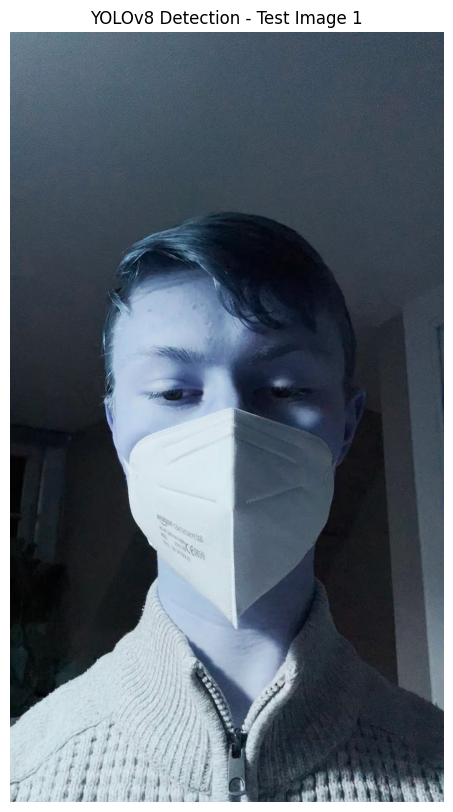


image 1/1 /content/construction_safety_yolo/valid/images/00001.jpg: 640x640 3 hardhats, 16.1ms
Speed: 4.4ms preprocess, 16.1ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


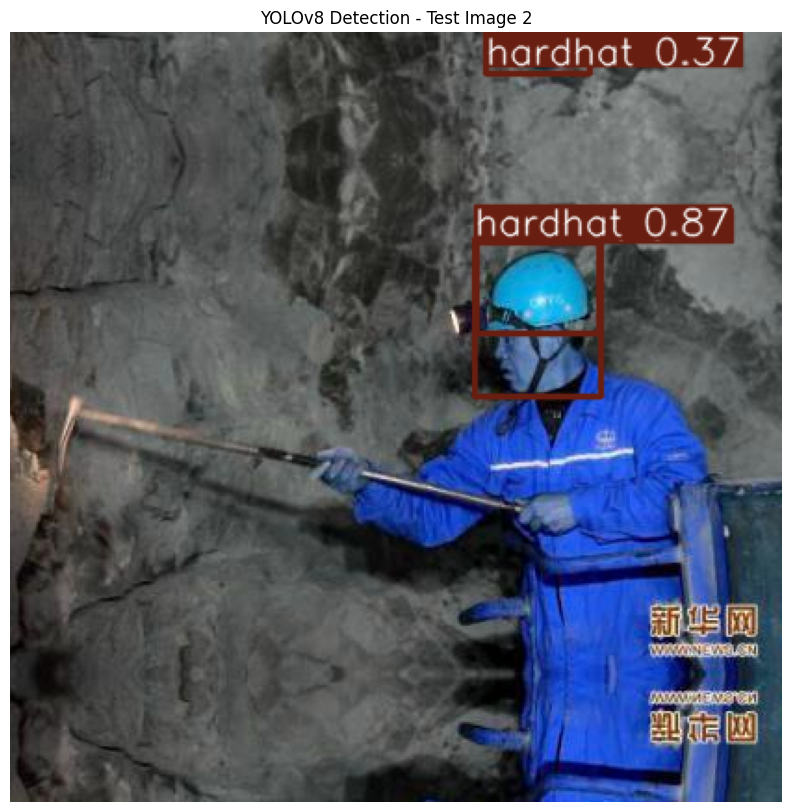


image 1/1 /content/construction_safety_yolo/valid/images/00046.jpg: 512x640 4 hardhats, 12.4ms
Speed: 2.6ms preprocess, 12.4ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 640)


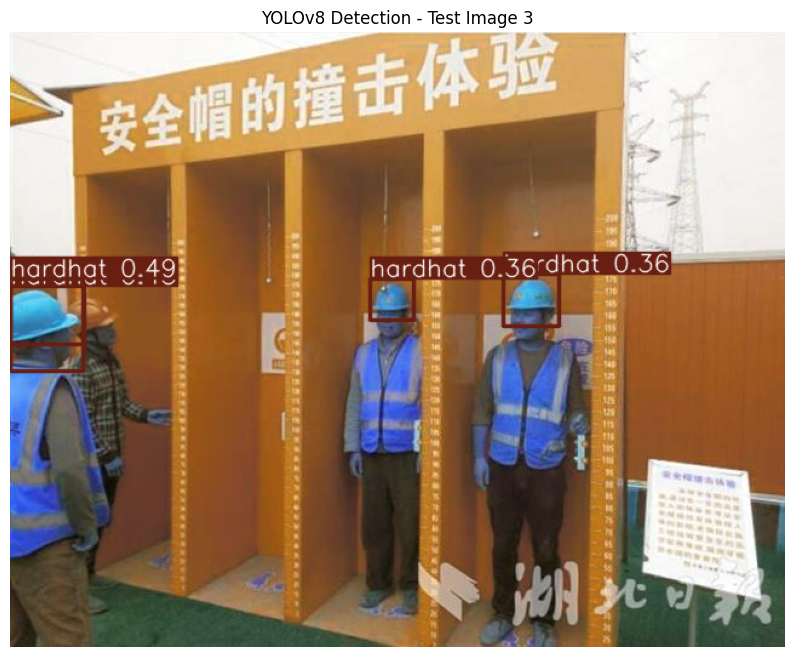


image 1/1 /content/construction_safety_yolo/valid/images/00038.jpg: 640x640 5 hardhats, 17.4ms
Speed: 4.1ms preprocess, 17.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


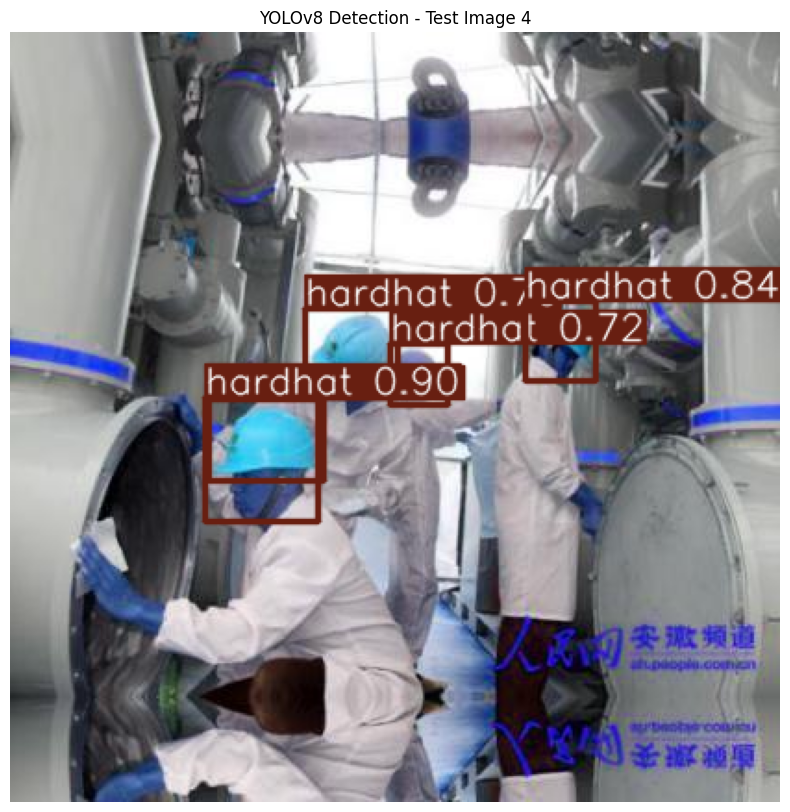


image 1/1 /content/construction_safety_yolo/valid/images/00017.jpg: 448x640 1 wheel loader, 13.0ms
Speed: 3.0ms preprocess, 13.0ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)


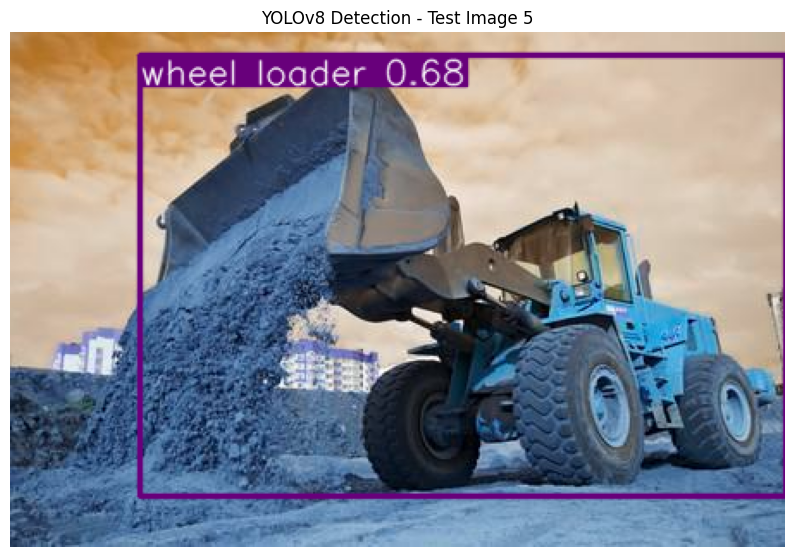


image 1/1 /content/construction_safety_yolo/valid/images/00056.jpg: 640x640 (no detections), 11.0ms
Speed: 4.1ms preprocess, 11.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


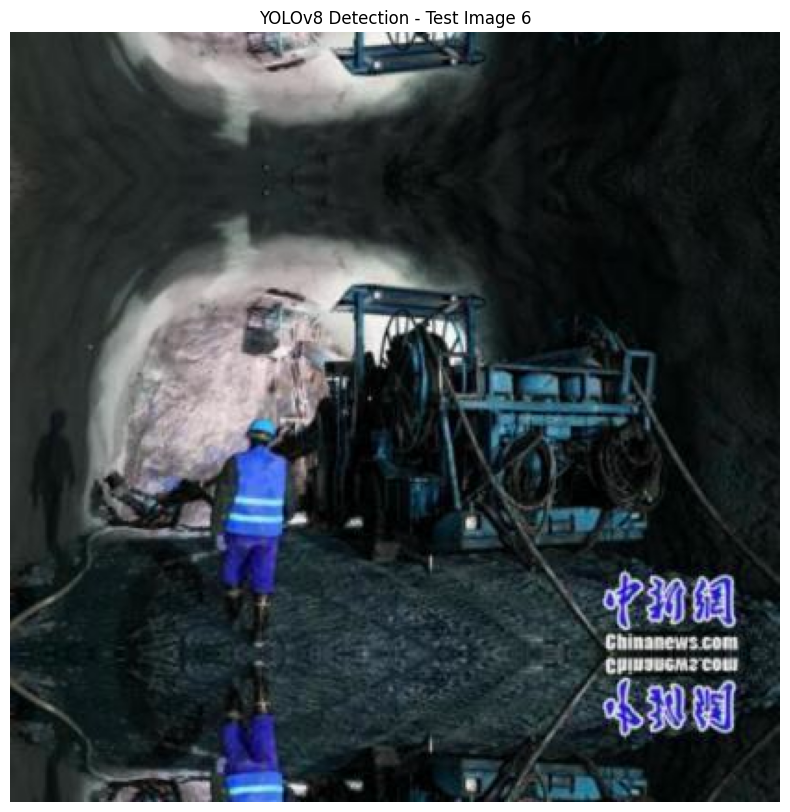


image 1/1 /content/construction_safety_yolo/valid/images/00002.jpg: 384x640 18 hardhats, 10.9ms
Speed: 3.0ms preprocess, 10.9ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)


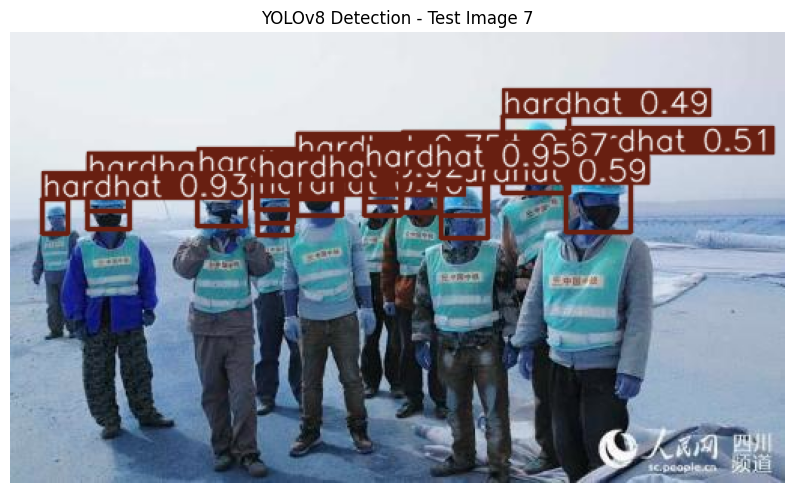


image 1/1 /content/construction_safety_yolo/valid/images/00006.jpg: 384x640 1 dump truck, 1 wheel loader, 9.9ms
Speed: 2.4ms preprocess, 9.9ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


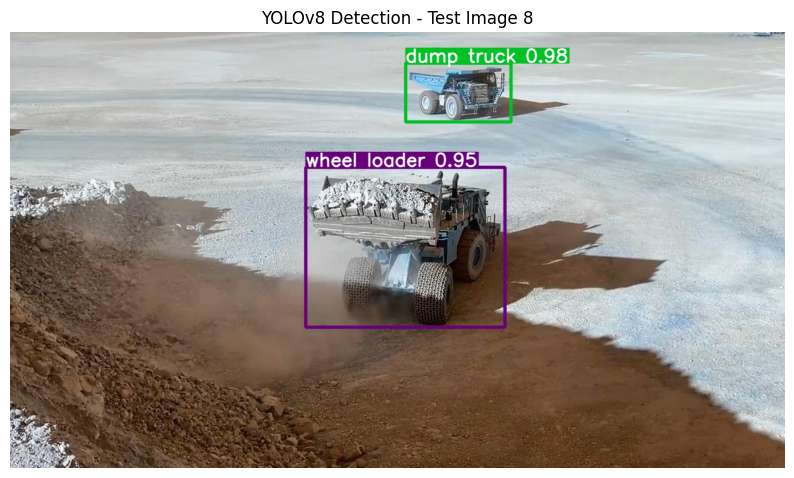


image 1/1 /content/construction_safety_yolo/valid/images/00015.jpg: 640x640 1 hardhat, 10.6ms
Speed: 5.1ms preprocess, 10.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


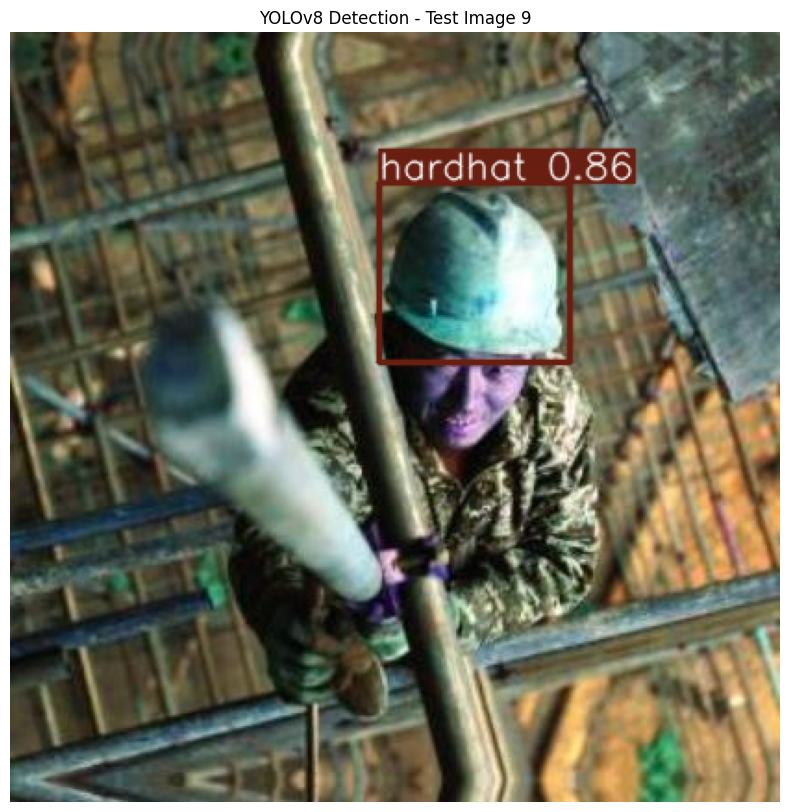


image 1/1 /content/construction_safety_yolo/valid/images/00039.jpg: 640x640 4 hardhats, 8.7ms
Speed: 4.7ms preprocess, 8.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


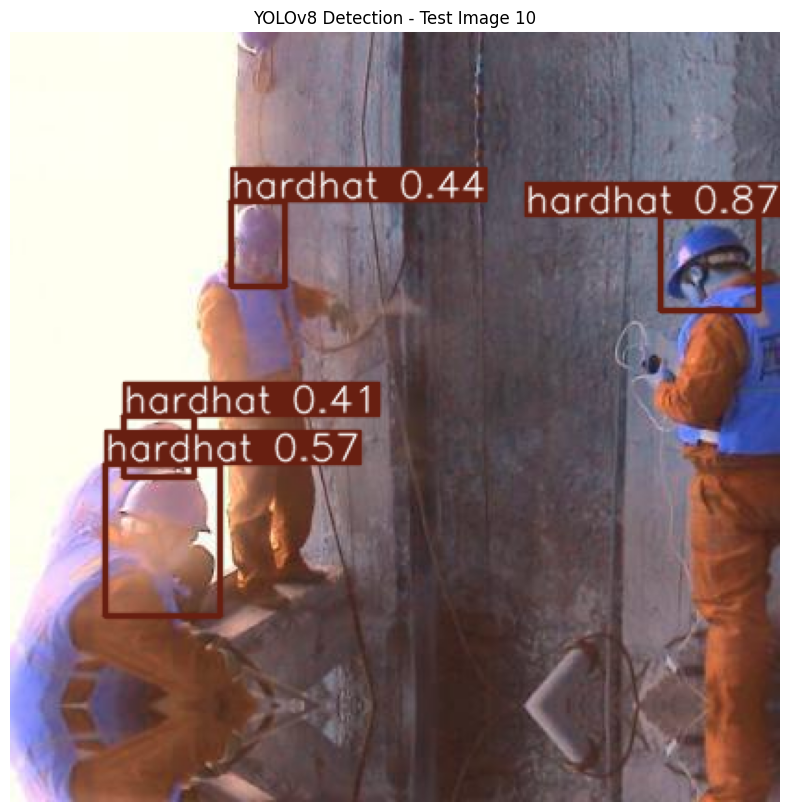

In [19]:
# Visualize model predictions
print("Visualizing predictions...")

# Assuming 'construction_safety_yolo' is the directory and 'valid' is a subdirectory
import os
image_folder = os.path.join('construction_safety_yolo', 'valid', 'images')  # Correct path

# Get a list of image paths from the folder
image_paths = [os.path.join(image_folder, filename) for filename in os.listdir(image_folder) if filename.endswith(('.jpg', '.png'))]

for i, image_path in enumerate(image_paths):  # Iterate through image paths
    if i >= 10:  # Stop after processing 3 images
        break
    results = yolo_model(image_path, conf=0.25)
    plt.figure(figsize=(10, 10))
    plt.imshow(results[0].plot())
    plt.axis('off')
    plt.title(f"YOLOv8 Detection - Test Image {i+1}")
    plt.show()

## Test on local files

Upload your images (JPG or PNG)...


Saving aa.png to aa.png
Visualizing predictions...

image 1/1 /content/uploaded_images/aa.png: 384x640 16 hardhats, 1 no-hardhat, 9.9ms
Speed: 3.1ms preprocess, 9.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


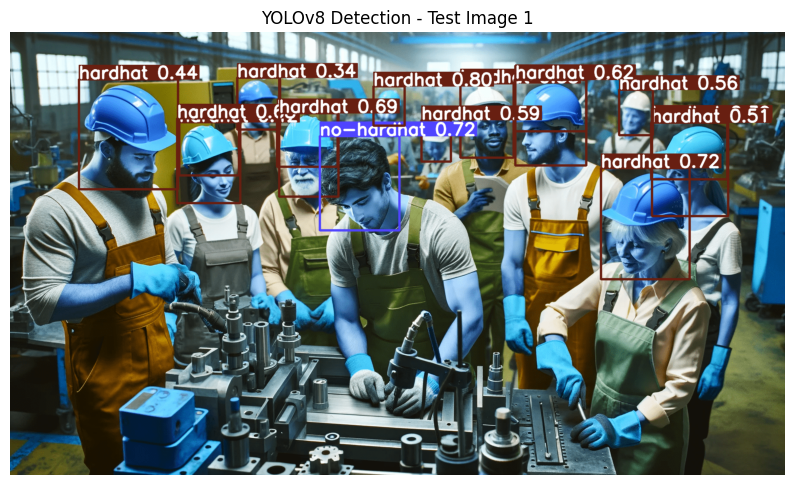

In [20]:
from google.colab import files
# Step 1: Upload images manually
print("Upload your images (JPG or PNG)...")
uploaded = files.upload()  # Select up to 10 images from your local machine
# Step 2: Save uploaded files into a temporary folder
image_folder = "uploaded_images"
os.makedirs(image_folder, exist_ok=True)
for filename in uploaded.keys():
    new_path = os.path.join(image_folder, filename)
    os.rename(filename, new_path)
# Step 4: Run detection and visualize predictions
print("Visualizing predictions...")
image_paths = [os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.lower().endswith(('.jpg', '.png'))]
for i, image_path in enumerate(image_paths):
    if i >= 10:
        break
    results = yolo_model(image_path, conf=0.25)
    plt.figure(figsize=(10, 10))
    plt.imshow(results[0].plot())
    plt.axis('off')
    plt.title(f"YOLOv8 Detection - Test Image {i+1}")
    plt.show()